<a href="https://colab.research.google.com/github/michaelraef12/Data-Mining-Projects/blob/main/Clustering_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Clustering

## Dataset Description

The dataset file contains almost ~3000 different music genres aggregated from more than 170.000 songs collected from Spotify Web API.

Primary:

- genre (Music genre)

Numerical:

- acousticness (Ranges from 0 to 1)
- danceability (Ranges from 0 to 1)
- energy (Ranges from 0 to 1)
- duration_ms (Integer typically ranging from 200k to 300k)
- instrumentalness (Ranges from 0 to 1)
- valence (Ranges from 0 to 1)
- popularity (Ranges from 0 to 100)
- tempo (Float typically ranging from 50 to 150)
- liveness (Ranges from 0 to 1)
- loudness (Float typically ranging from -60 to 0 in decibels (dB))
- speechiness (Ranges from 0 to 1)
- year (Ranges from 1921 to 2020)


Categorical:

- key (All keys on octave encoded as values ranging from 0 to 11, starting on C as 0, C# as 1 and so on…)


**Recommended Reading for Data Understanding**: Spotify's documentation of audio features: https://developer.spotify.com/documentation/web-api/reference/tracks/get-audio-features/

**Acknowledgment**: This dataset was created and published by Yamaç Eren Ay on Kaggle.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_style('whitegrid')

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/GUC-DM/W2022/main/data/music_genres.csv')
df.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


Data Inspection:

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB


In [ ]:
df.describe()


,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
count,2973.000000,2973.000000,2973.000000,2.973000e+03,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000
mean,0.833165,0.401241,0.537187,2.517209e+05,0.561143,0.211366,0.192800,-10.509848,0.083588,119.018723,0.492748,39.919185,5.938782
std,0.372891,0.319760,0.150668,9.465686e+04,0.234486,0.267329,0.092356,5.369202,0.080483,17.469188,0.201820,16.748723,3.368110
min,0.000000,0.000003,0.056900,3.094600e+04,0.001002,0.000000,0.022200,-41.825000,0.023800,47.135722,0.003353,0.000000,0.000000
25%,1.000000,0.119050,0.441202,2.063788e+05,0.395058,0.004835,0.137687,-12.427656,0.044900,109.198143,0.348578,32.491279,3.000000
50%,1.000000,0.321745,0.546496,2.375453e+05,0.601195,0.080700,0.178764,-9.221817,0.059457,119.194167,0.500048,43.056569,7.000000
75%,1.000000,0.673991,0.647500,2.772720e+05,0.730127,0.343333,0.220856,-6.920125,0.091000,127.508750,0.640257,51.138889,9.000000
max,1.000000,0.996000,0.929000,2.382587e+06,0.994667,0.992000,0.960000,0.060000,0.946219,204.212000,0.980000,80.666667,11.000000


In [ ]:
df.shape

(2973, 14)

In [ ]:
# to discover if there are null values
df.isnull().sum()

mode                0
genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
key                 0
dtype: int64

In [ ]:
#to discover unique values for genres coloum but we find that there are alot of genres which it will be useless in our inspection of data
df['genres'].unique()

array(['21st century classical', '432hz', '8-bit', ..., 'zouk',
       'zurich indie', 'zydeco'], dtype=object)

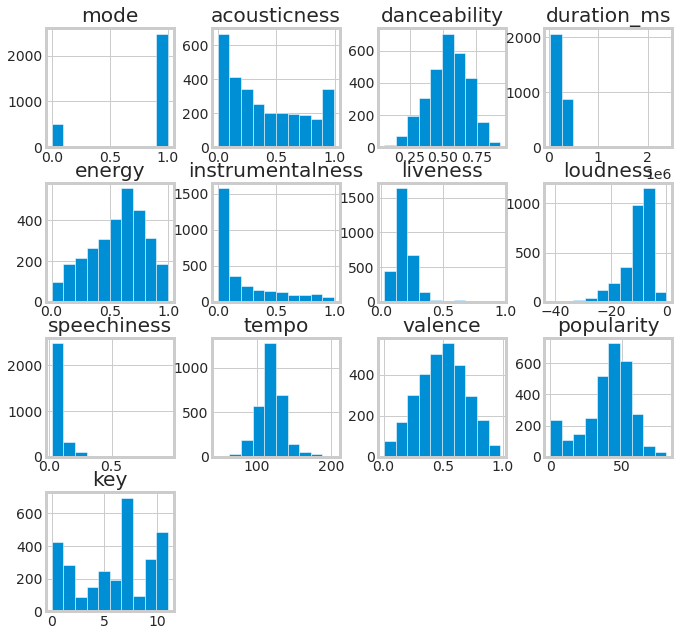

In [ ]:
# to know if the data is normally distributed or not, we found that there are some of the attributes have skweness so we need to normalize the dataset to cluster the data efficiently
df.hist(figsize=(10,10));


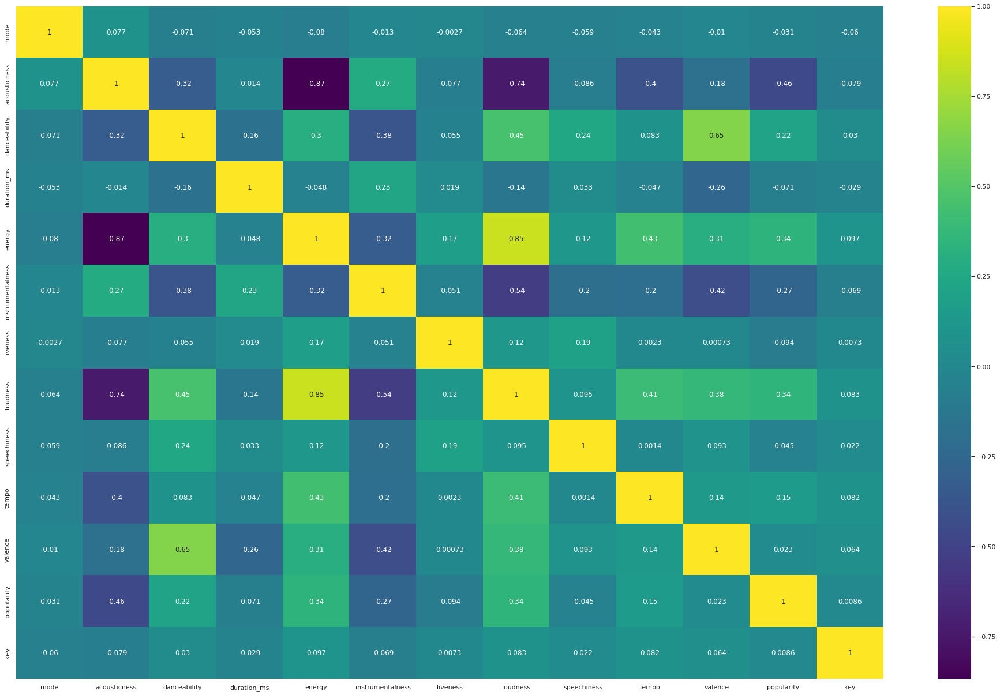

In [ ]:
# In clustring, we need to drop the attriutes that have a very high correlation to avoid biases, we put a max correlation value is 0.9 while there are no attributes we need to drop it
sns.set(rc={'figure.figsize':(30,20)})
sns.heatmap(df.corr(), cmap='viridis', annot = True);



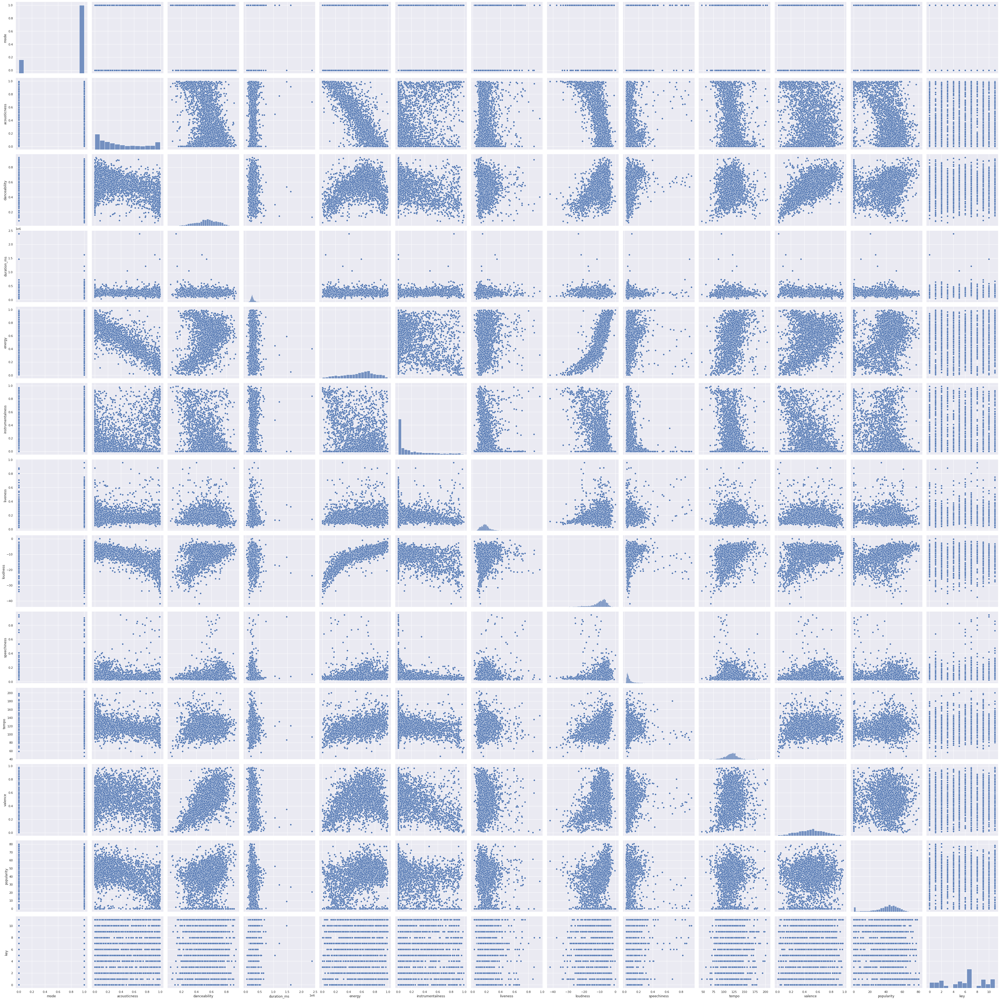

In [ ]:
# another visualization to identify the correlation between attributes
sns.pairplot(df, height=4);

1. What are the 5 most popular music genres?

basshall, turkish edm, south african house, trap venezolano and alberta hip hop

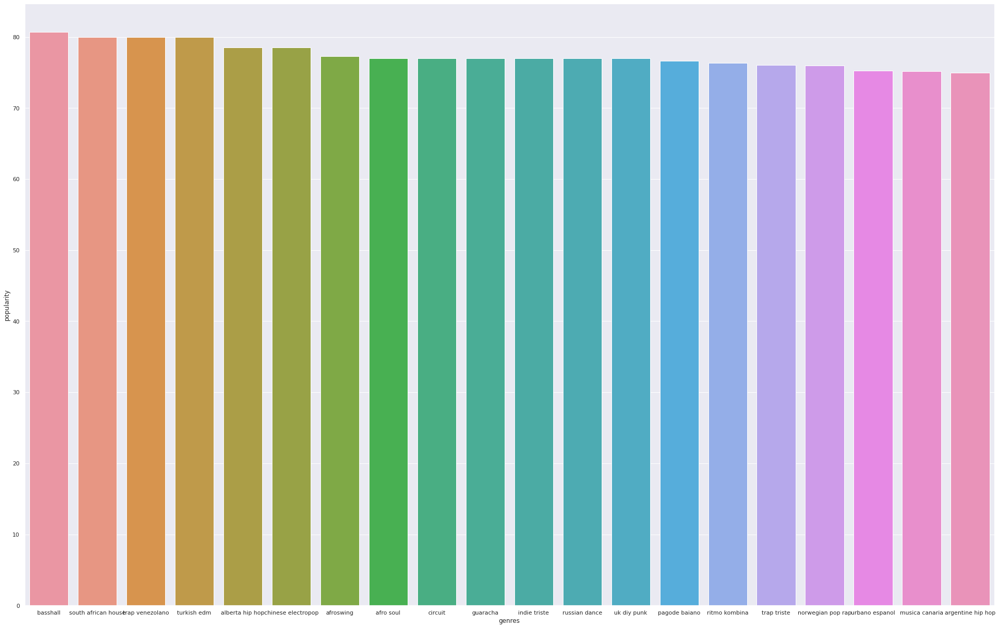

In [ ]:
largest_five= df.nlargest(20,'popularity')
ax = sns.barplot(x="genres",y='popularity', data=largest_five)


In [ ]:
df.sort_values(by=['popularity'], ascending=False)


,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
237,1,basshall,0.213167,0.818000,169799.166667,0.630167,0.000020,0.081067,-6.627833,0.134833,115.092500,0.588667,80.666667,2
2778,0,turkish edm,0.008290,0.698000,186700.000000,0.719000,0.000004,0.326000,-4.923000,0.045500,120.062000,0.364000,80.000000,0
2533,1,south african house,0.043833,0.847000,311854.333333,0.562333,0.130339,0.075133,-7.719000,0.050733,123.676333,0.834333,80.000000,1
2755,1,trap venezolano,0.044600,0.877000,231848.000000,0.777000,0.000035,0.086300,-4.246000,0.117000,102.020000,0.706000,80.000000,1
46,0,alberta hip hop,0.330000,0.885000,144000.000000,0.685000,0.000000,0.148000,-6.429000,0.062700,99.954000,0.937000,78.500000,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2888,1,vintage spanish pop,0.767643,0.518357,174425.535714,0.576464,0.064063,0.374500,-10.186536,0.101464,111.531429,0.693607,0.000000,7
828,1,deep progressive house,0.000781,0.804000,534194.000000,0.656000,0.932000,0.648000,-10.475000,0.063300,123.994000,0.240000,0.000000,0
1428,1,israeli folk,0.887687,0.474496,160580.104167,0.031602,0.056507,0.113085,-23.825333,0.107354,114.466625,0.327615,0.000000,11
2681,1,tajik pop,0.991000,0.789000,209717.000000,0.335000,0.008580,0.189000,-8.478000,0.094800,101.549000,0.847000,0.000000,5


2. What factors affect the Popularity of the song ? (Mention the biggest 2 factors, with interpretation)

Acousticness(-0.46): negative correlation, this indicates a negative relationship indicating the more popular the song the less acoustics, on the other hand the less popular the higher acoustics

Energy (0.34): positive correlation, this indicates that both variables increase together an increase in energy would result in an increase in puplarity 

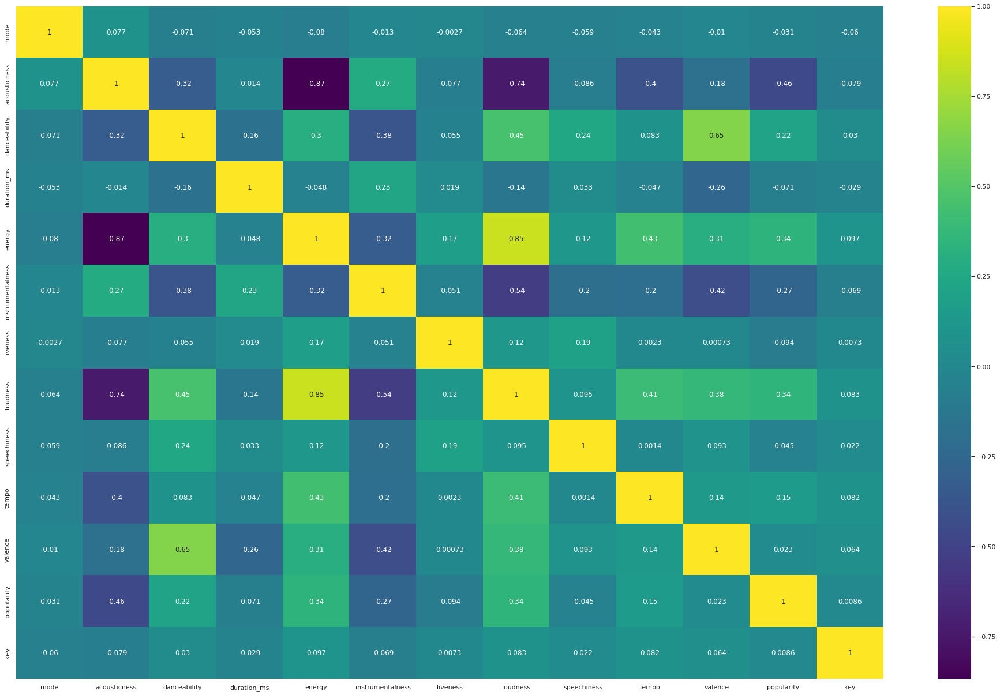

In [ ]:
sns.set(rc={'figure.figsize':(30,20)})
sns.heatmap(df.corr(), cmap='viridis', annot = True)

3. Which genre has the highest energy and which has the lowest?

Highest: australian ska 

Lowest: brain waves, binaural

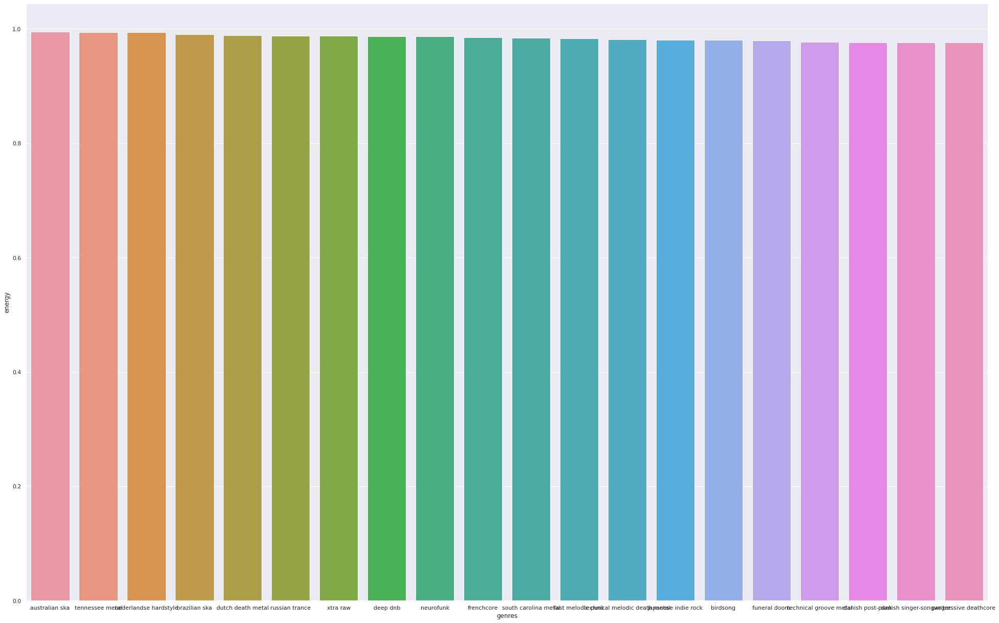

In [ ]:
largest_five= df.nlargest(20,'energy')
ax = sns.barplot(x="genres",y='energy', data=largest_five)


In [ ]:
df.sort_values(by=['energy'], ascending=False)


,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
175,0,australian ska,0.000096,0.312667,211724.666667,0.994667,0.000183,0.1561,-4.3560,0.158667,148.061,0.228900,43.333333,9
2706,1,tennessee metal,0.000891,0.372000,264013.333333,0.994333,0.040620,0.1780,-4.6210,0.192667,122.180,0.105967,46.000000,11
1897,0,nederlandse hardstyle,0.076200,0.341000,237818.000000,0.994000,0.000000,0.3520,0.0600,0.374000,157.607,0.220000,0.000000,1
348,0,brazilian ska,0.500000,0.320000,172176.000000,0.991000,0.000004,0.2260,-7.0470,0.220000,167.532,0.545000,13.000000,9
913,1,dutch death metal,0.000040,0.306000,279093.000000,0.989000,0.000410,0.2700,-5.0870,0.109000,103.006,0.134000,38.000000,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1723,1,medieval,0.995000,0.533000,136072.000000,0.004440,0.796000,0.1110,-29.4720,0.060400,80.919,0.176000,0.000000,8
2476,1,singing bowl,0.916000,0.056900,554747.000000,0.004130,0.971000,0.1200,-30.6840,0.057500,56.436,0.024500,45.000000,3
1611,1,korean classical piano,0.993500,0.379500,135913.500000,0.003950,0.946500,0.0986,-37.6195,0.052450,68.906,0.349500,49.000000,8
283,1,binaural,0.993500,0.439500,122174.500000,0.001002,0.802500,0.1090,-41.8250,0.079500,68.144,0.184100,59.000000,3


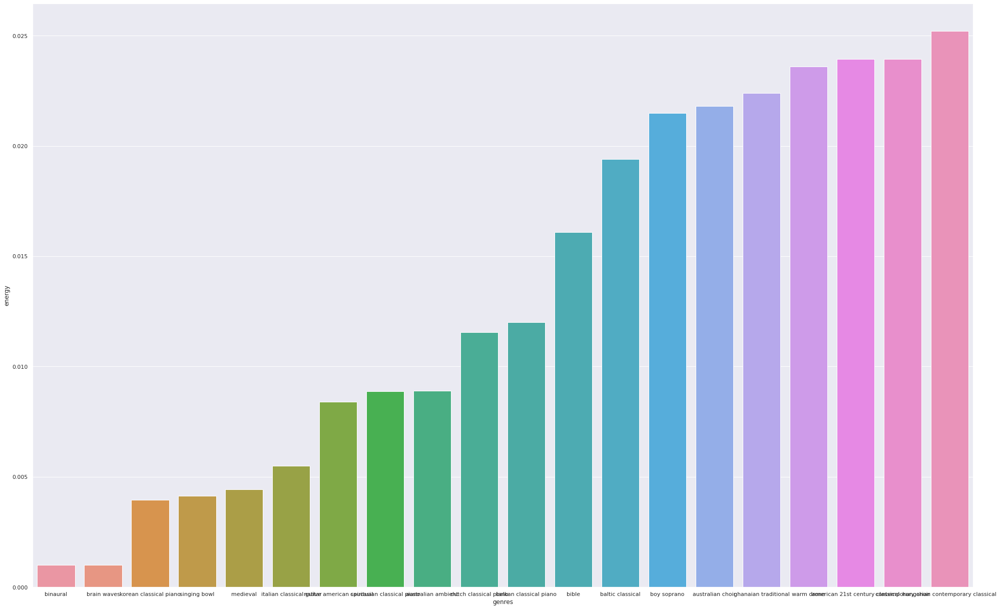

In [ ]:
largest_five= df.nsmallest(20,'energy')
ax = sns.barplot(x="genres",y='energy', data=largest_five)


In [ ]:
df.sort_values(by=['energy'], ascending=True)


,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
328,1,brain waves,0.993500,0.439500,122174.500000,0.001002,0.802500,0.1090,-41.8250,0.079500,68.144,0.184100,59.000000,3
283,1,binaural,0.993500,0.439500,122174.500000,0.001002,0.802500,0.1090,-41.8250,0.079500,68.144,0.184100,59.000000,3
1611,1,korean classical piano,0.993500,0.379500,135913.500000,0.003950,0.946500,0.0986,-37.6195,0.052450,68.906,0.349500,49.000000,8
2476,1,singing bowl,0.916000,0.056900,554747.000000,0.004130,0.971000,0.1200,-30.6840,0.057500,56.436,0.024500,45.000000,3
1723,1,medieval,0.995000,0.533000,136072.000000,0.004440,0.796000,0.1110,-29.4720,0.060400,80.919,0.176000,0.000000,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
913,1,dutch death metal,0.000040,0.306000,279093.000000,0.989000,0.000410,0.2700,-5.0870,0.109000,103.006,0.134000,38.000000,2
348,0,brazilian ska,0.500000,0.320000,172176.000000,0.991000,0.000004,0.2260,-7.0470,0.220000,167.532,0.545000,13.000000,9
1897,0,nederlandse hardstyle,0.076200,0.341000,237818.000000,0.994000,0.000000,0.3520,0.0600,0.374000,157.607,0.220000,0.000000,1
2706,1,tennessee metal,0.000891,0.372000,264013.333333,0.994333,0.040620,0.1780,-4.6210,0.192667,122.180,0.105967,46.000000,11


4. What are the most correlated pairs of attributes ? (Mention 2 pairs, with interpretation)

Loudness and energy (positive) (0.85) an increase loudness results in an increase in energy by 85%

Acousticness and energy (negative) (-0.87) an increase in acousticness results in a decrease in energy by 87% 

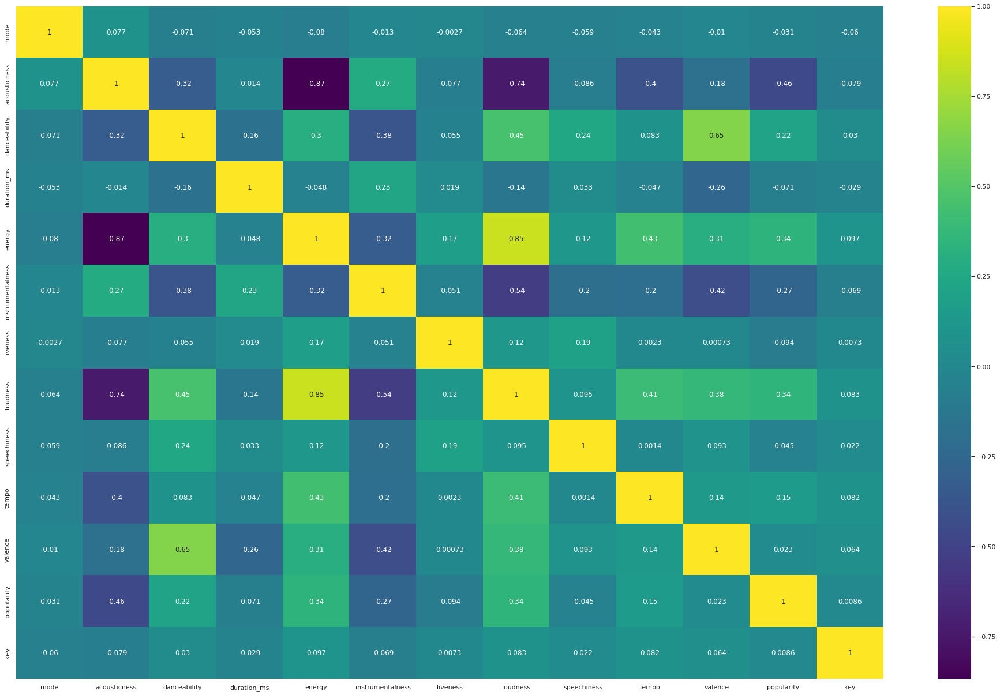

In [ ]:
sns.set(rc={'figure.figsize':(30,20)})
sns.heatmap(df.corr(), cmap='viridis', annot = True);

5. Bonus: Plot the words frequency in genres. Which main genre categories 
have the most sub-genres? (mention
at least 3)

Deep East Coast Hip Hop

New wave of thrash metal

old school uk hip hop




In [ ]:
df_copy1= df.copy()

In [ ]:
df_copy1['count'] = df_copy1['genres'].str.count(' ') + 1

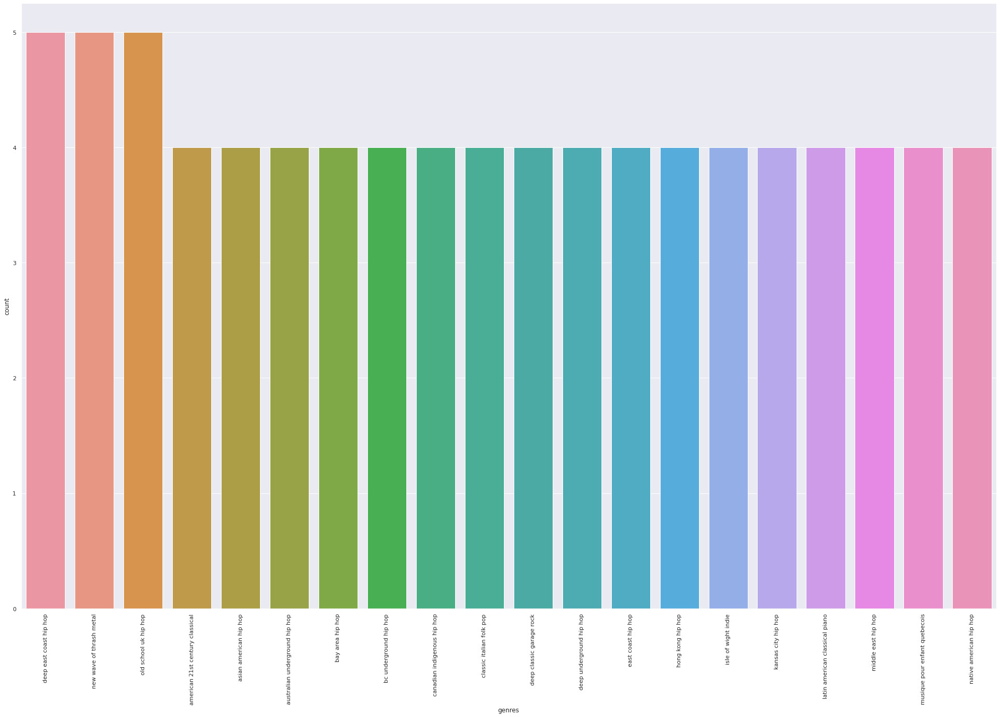

In [ ]:
largest_five= df_copy1.nlargest(20,'count')
ax = sns.barplot(x="genres",y='count', data=largest_five)
ax.tick_params(axis='x', rotation=90)


Data Preprocessing:


In [ ]:
df_copy = df.copy()

In [ ]:
# as we stated above, that the column genres is useless in clustering the dataset in addition it is text while the clustring take input numerical values
df_copy = df_copy.drop('genres', axis='columns')


In [ ]:
df.describe()

,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
count,2973.000000,2973.000000,2973.000000,2.973000e+03,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000
mean,0.833165,0.401241,0.537187,2.517209e+05,0.561143,0.211366,0.192800,-10.509848,0.083588,119.018723,0.492748,39.919185,5.938782
std,0.372891,0.319760,0.150668,9.465686e+04,0.234486,0.267329,0.092356,5.369202,0.080483,17.469188,0.201820,16.748723,3.368110
min,0.000000,0.000003,0.056900,3.094600e+04,0.001002,0.000000,0.022200,-41.825000,0.023800,47.135722,0.003353,0.000000,0.000000
25%,1.000000,0.119050,0.441202,2.063788e+05,0.395058,0.004835,0.137687,-12.427656,0.044900,109.198143,0.348578,32.491279,3.000000
50%,1.000000,0.321745,0.546496,2.375453e+05,0.601195,0.080700,0.178764,-9.221817,0.059457,119.194167,0.500048,43.056569,7.000000
75%,1.000000,0.673991,0.647500,2.772720e+05,0.730127,0.343333,0.220856,-6.920125,0.091000,127.508750,0.640257,51.138889,9.000000
max,1.000000,0.996000,0.929000,2.382587e+06,0.994667,0.992000,0.960000,0.060000,0.946219,204.212000,0.980000,80.666667,11.000000


In [ ]:
#coverting the values from ms to minutes 
df_copy['duration_ms'] = df_copy['duration_ms'].div(60000)

In [ ]:
df_copy.describe()

,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
count,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000
mean,0.833165,0.401241,0.537187,4.195348,0.561143,0.211366,0.192800,-10.509848,0.083588,119.018723,0.492748,39.919185,5.938782
std,0.372891,0.319760,0.150668,1.577614,0.234486,0.267329,0.092356,5.369202,0.080483,17.469188,0.201820,16.748723,3.368110
min,0.000000,0.000003,0.056900,0.515767,0.001002,0.000000,0.022200,-41.825000,0.023800,47.135722,0.003353,0.000000,0.000000
25%,1.000000,0.119050,0.441202,3.439647,0.395058,0.004835,0.137687,-12.427656,0.044900,109.198143,0.348578,32.491279,3.000000
50%,1.000000,0.321745,0.546496,3.959089,0.601195,0.080700,0.178764,-9.221817,0.059457,119.194167,0.500048,43.056569,7.000000
75%,1.000000,0.673991,0.647500,4.621200,0.730127,0.343333,0.220856,-6.920125,0.091000,127.508750,0.640257,51.138889,9.000000
max,1.000000,0.996000,0.929000,39.709778,0.994667,0.992000,0.960000,0.060000,0.946219,204.212000,0.980000,80.666667,11.000000


In [ ]:
# we made normalization on float columns to be within 0 and 1 inorder to prevent losing the value of our dataset
numerical_columns = [ 'key','popularity', 'tempo','duration_ms','loudness']


df_copy[numerical_columns] = ( 
    
    df_copy[numerical_columns] - df_copy[numerical_columns].min()  
    
) /( 
    
    df_copy[numerical_columns].max() - df_copy[numerical_columns].min()
)



In [ ]:
df_copy.describe()

,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
count,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000
mean,0.833165,0.401241,0.537187,0.093881,0.561143,0.211366,0.192800,0.747646,0.083588,0.457631,0.492748,0.494866,0.539889
std,0.372891,0.319760,0.150668,0.040251,0.234486,0.267329,0.092356,0.128189,0.080483,0.111215,0.201820,0.207629,0.306192
min,0.000000,0.000003,0.056900,0.000000,0.001002,0.000000,0.022200,0.000000,0.023800,0.000000,0.003353,0.000000,0.000000
25%,1.000000,0.119050,0.441202,0.074600,0.395058,0.004835,0.137687,0.701859,0.044900,0.395110,0.348578,0.402784,0.272727
50%,1.000000,0.321745,0.546496,0.087853,0.601195,0.080700,0.178764,0.778398,0.059457,0.458748,0.500048,0.533759,0.636364
75%,1.000000,0.673991,0.647500,0.104746,0.730127,0.343333,0.220856,0.833350,0.091000,0.511682,0.640257,0.633953,0.818182
max,1.000000,0.996000,0.929000,1.000000,0.994667,0.992000,0.960000,1.000000,0.946219,1.000000,0.980000,1.000000,1.000000


Data Modeling:

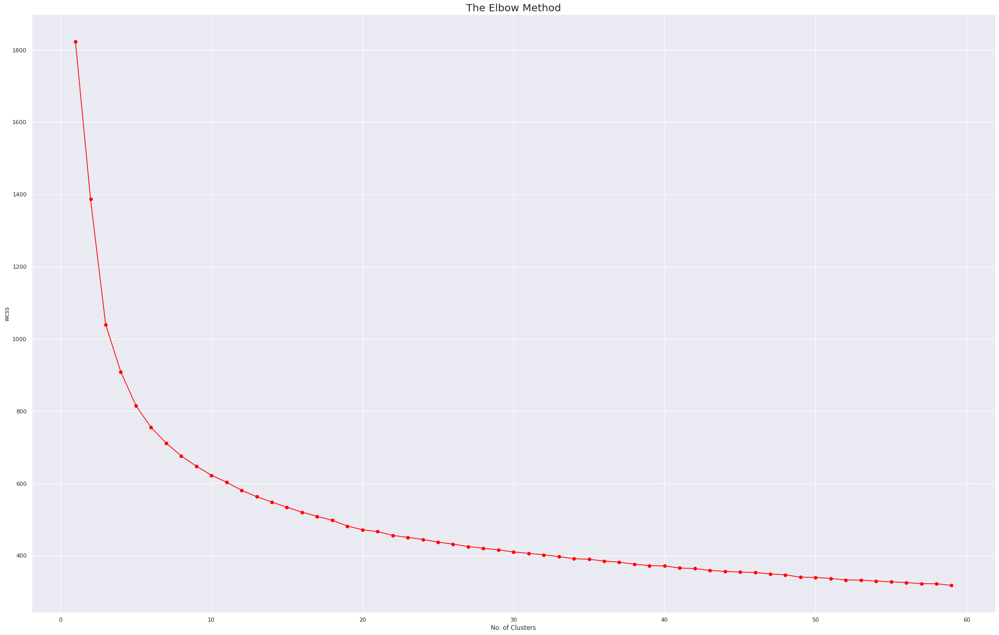

In [ ]:
#We use elbow method to know how many clusters is the most efficient, we also used a high range as there are alot of attributes in the data set
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 60):
    km = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    km.fit(df_copy)
    wcss.append(km.inertia_)
    
plt.plot(range(1, 60), wcss, marker='o', color='red')
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

In [ ]:
km = KMeans(n_clusters=10, init='k-means++', max_iter=300, n_init=10, random_state=0)
km.fit(df_copy)

# Get the cluster labels for the fitted data
labels = km.labels_
labels

array([4, 4, 9, ..., 3, 8, 3], dtype=int32)

In [ ]:
#we need to insert the labels columns in dataset in order to identify which record corresponds to which cluster
df_copy['cluster'] = labels


In [ ]:
df_copy.head()

,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
0,1,0.979333,0.162883,0.055005,0.071317,0.606834,0.361600,0.246166,0.040567,0.179536,0.103783,0.345041,0.545455,4
1,1,0.494780,0.299333,0.432864,0.450678,0.477762,0.131000,0.596180,0.076817,0.465697,0.221750,0.650826,0.454545,4
2,1,0.762000,0.712000,0.035818,0.818000,0.876000,0.126000,0.779396,0.047000,0.549467,0.975000,0.595041,0.636364,9
3,1,0.651417,0.529093,0.085870,0.419146,0.205309,0.218696,0.705170,0.107872,0.418406,0.513604,0.258594,0.636364,7
4,1,0.676557,0.538961,0.067903,0.316434,0.003003,0.172254,0.700623,0.082851,0.413650,0.448249,0.568017,0.636364,0


Data Evaluation:

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

df_copy.groupby('cluster').describe()

mode                                    acousticness            \
         count mean  std  min  25%  50%  75%  max        count      mean   
cluster                                                                    
0        391.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0        391.0  0.575687   
1        451.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0        451.0  0.207156   
2        178.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0        178.0  0.221747   
3        505.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0        505.0  0.251065   
4        284.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0        284.0  0.861426   
5        194.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0        194.0  0.162758   
6        351.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0        351.0  0.088136   
7        330.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0        330.0  0.835339   
8        124.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0        124.0  0.810967   
9        165.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0        165.0  0.149890   

                                                                   \
              std       min       25%       50%       75%     max   
cluster                                                             
0        0.135311  0.254981  0.487852  0.567637  0.658005  0.9870   
1        0.163667  0.000023  0.076750  0.176000  0.290956  0.8010   
2        0.196246  0.000091  0.055665  0.168261  0.351315  0.7950   
3        0.121422  0.000305  0.159440  0.244843  0.336364  0.6355   
4        0.135109  0.359525  0.788836  0.903667  0.965796  0.9960   
5        0.169981  0.000003  0.023820  0.095097  0.250016  0.7320   
6        0.090907  0.000003  0.016831  0.063446  0.129136  0.6000   
7        0.114316  0.446125  0.764536  0.848250  0.931000  0.9944   
8        0.153723  0.371000  0.677493  0.834833  0.959833  0.9940   
9        0.166933  0.000005  0.003520  0.085379  0.258874  0.7620   

        danceability                                                    \
               count      mean       std       min       25%       50%   
cluster                                                                  
0              391.0  0.550378  0.086906  0.278000  0.501923  0.548200   
1              451.0  0.598899  0.123958  0.210583  0.505322  0.601747   
2              178.0  0.600741  0.146893  0.272000  0.483833  0.609833   
3              505.0  0.645189  0.087487  0.419000  0.576998  0.648625   
4              284.0  0.331689  0.099989  0.056900  0.269627  0.327115   
5              194.0  0.602782  0.165051  0.161000  0.509375  0.628625   
6              351.0  0.467735  0.108051  0.181000  0.400888  0.473000   
7              330.0  0.496662  0.117743  0.125000  0.425636  0.507493   
8              124.0  0.439263  0.157076  0.084700  0.318929  0.461816   
9              165.0  0.517108  0.182246  0.082567  0.379726  0.536750   

                            duration_ms                                \
              75%       max       count      mean       std       min   
cluster                                                                 
0        0.593434  0.830000       391.0  0.086933  0.024291  0.005978   
1        0.697692  0.897000       451.0  0.089764  0.021899  0.024244   
2        0.718134  0.929000       178.0  0.092185  0.029669  0.005046   
3        0.708221  0.911000       505.0  0.088177  0.019284  0.000000   
4        0.389125  0.664500       284.0  0.109657  0.050207  0.024784   
5        0.717577  0.907400       194.0  0.101347  0.032642  0.034195   
6        0.530152  0.801667       351.0  0.091978  0.024379  0.025636   
7        0.581232  0.799000       330.0  0.086548  0.057696  0.017040   
8        0.540183  0.903000       124.0  0.103772  0.104594  0.010854   
9        0.648417  0.852000       165.0  0.116237  0.036593  0.035818   

                                                energy                      \
              25%       50%       75%       max  count      mean       std   
cluster                                               

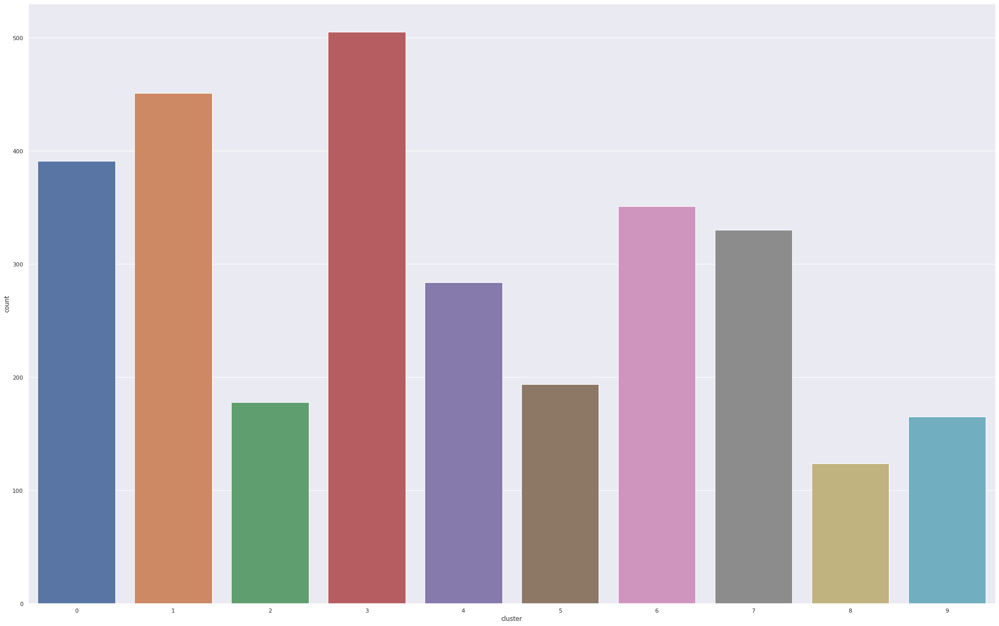

In [ ]:
# Visually plotting how many points belong to each cluster 
sns.countplot(x='cluster', data=df_copy)



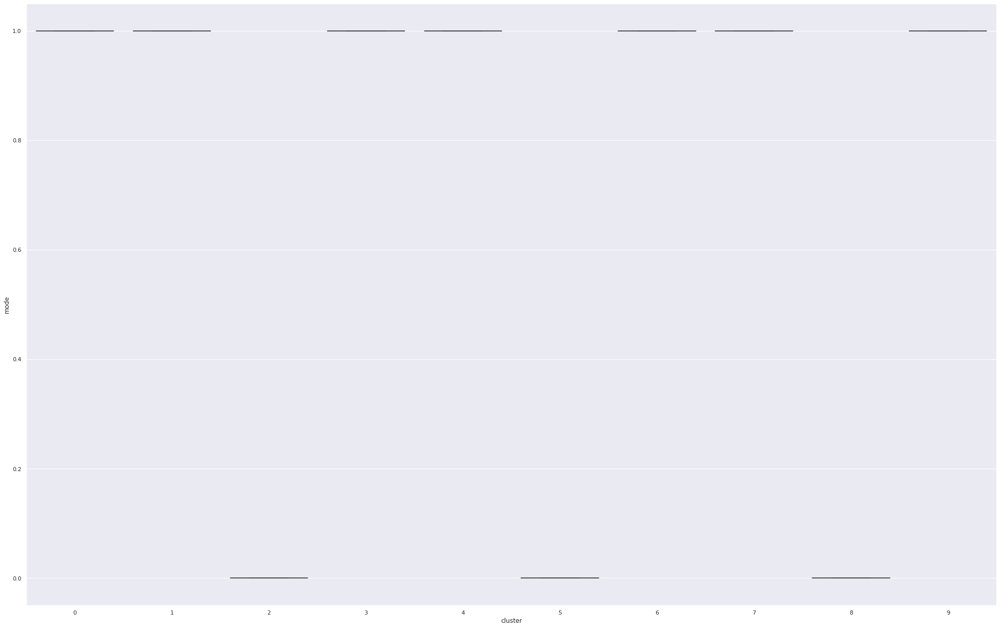

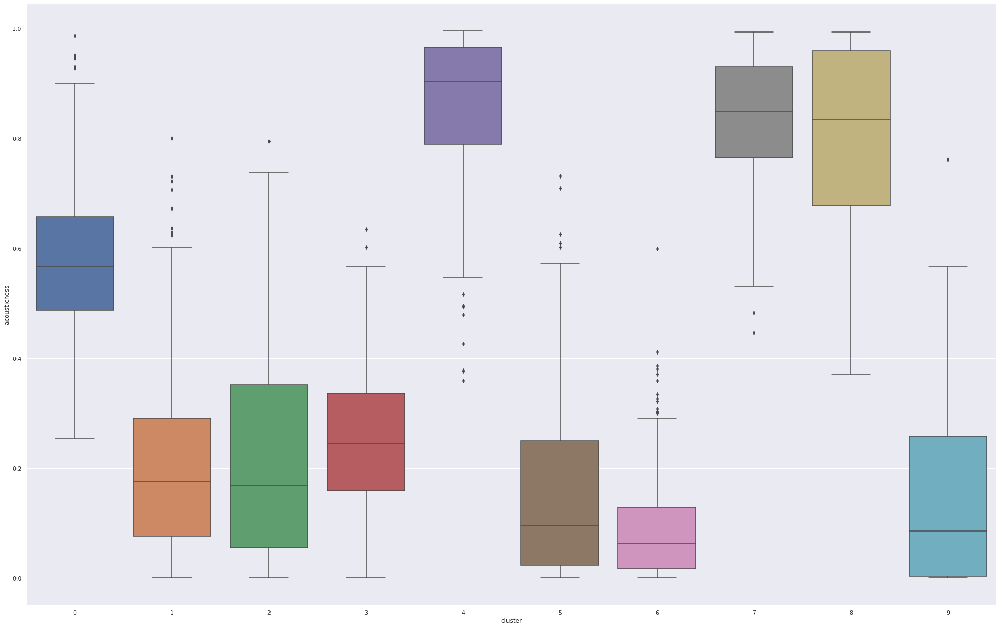

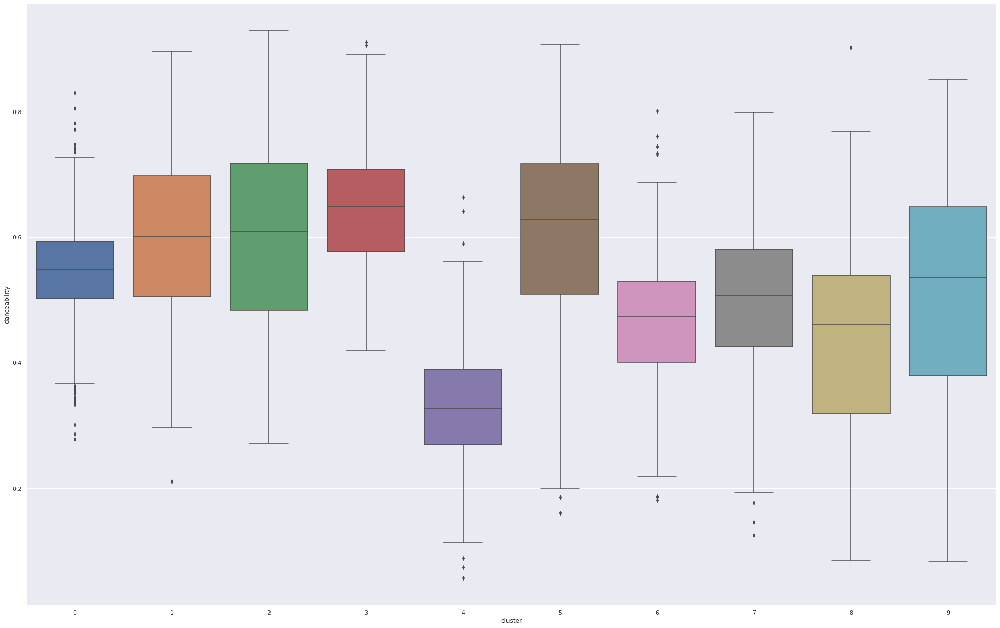

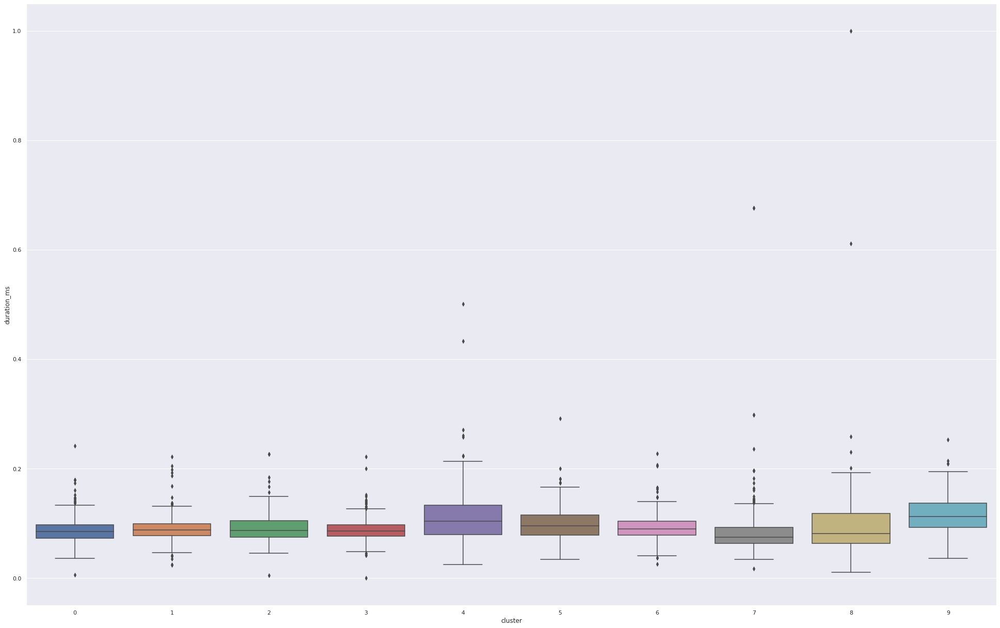

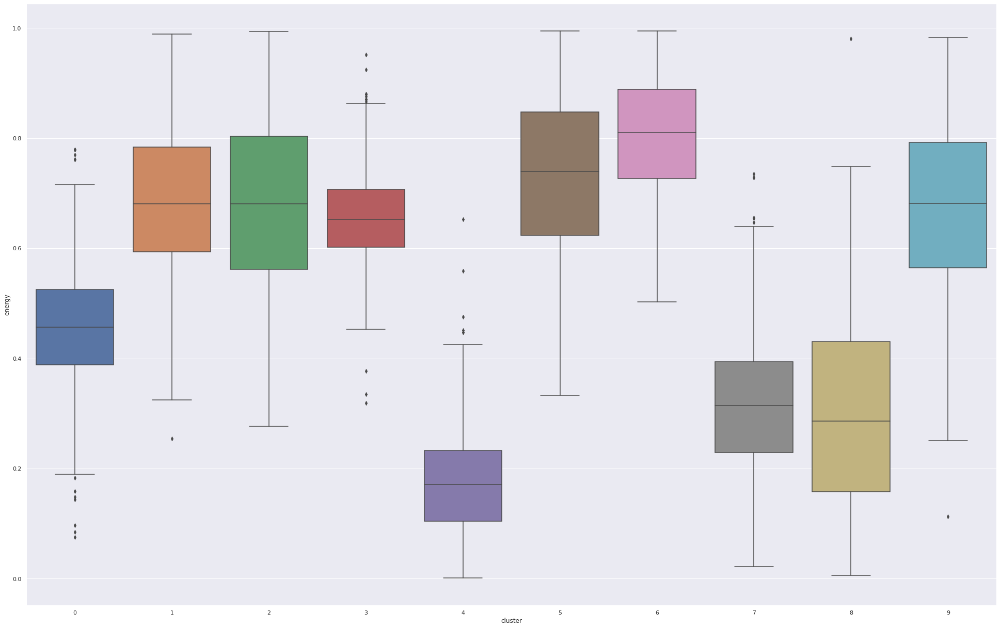

...

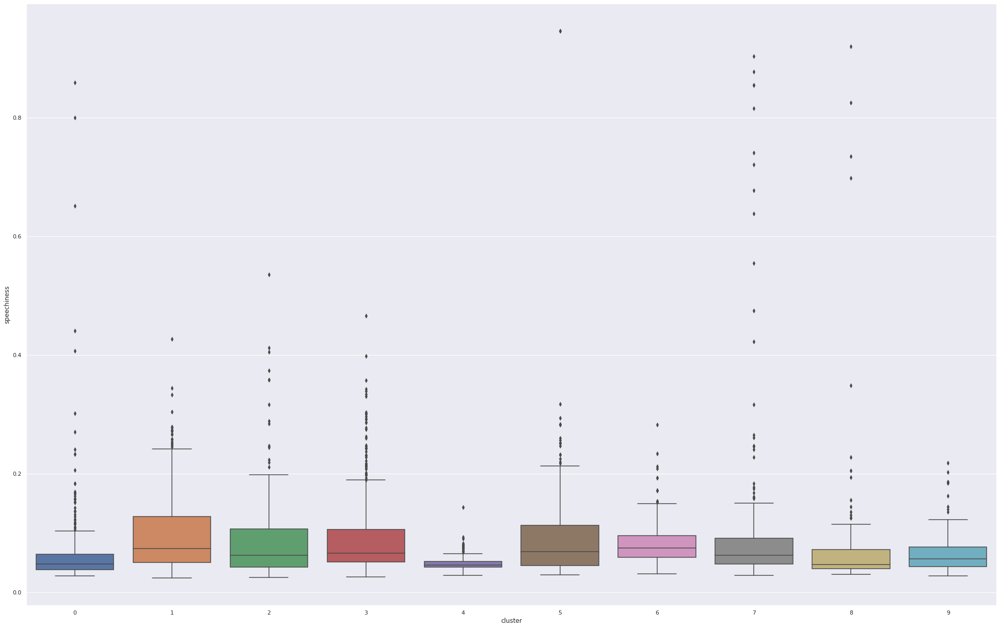

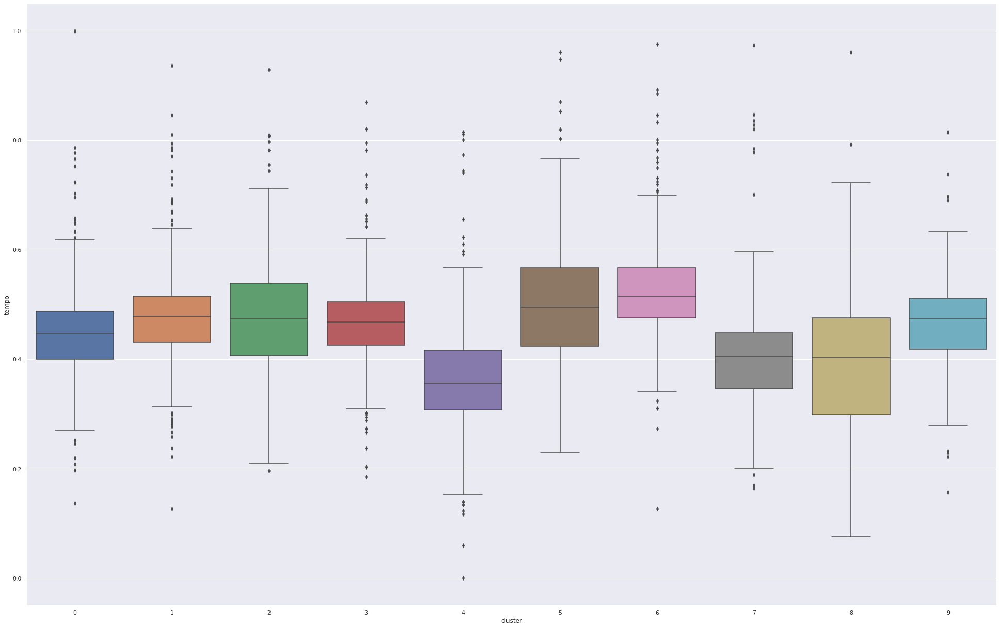

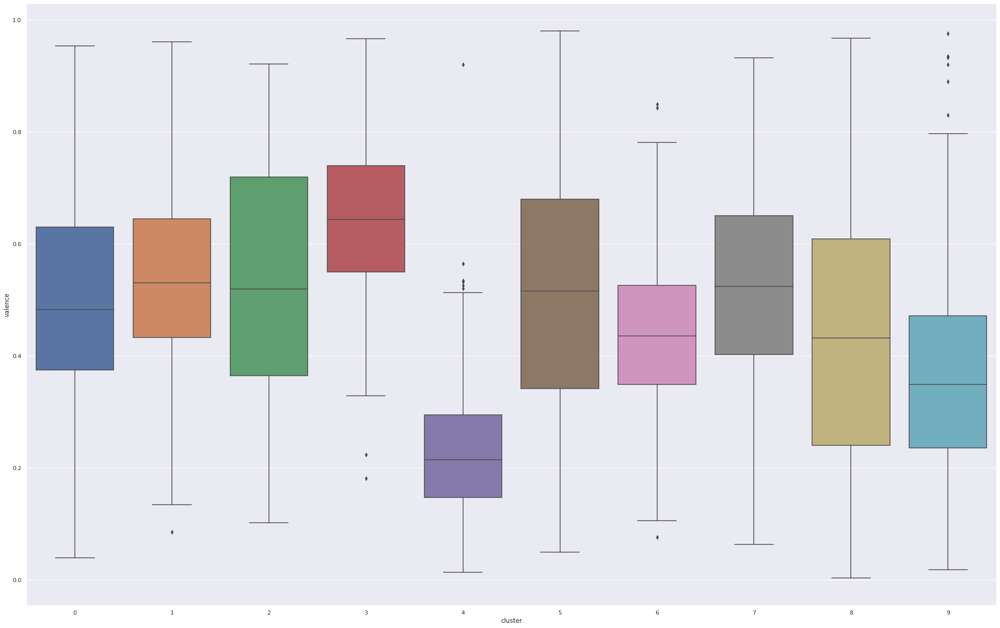

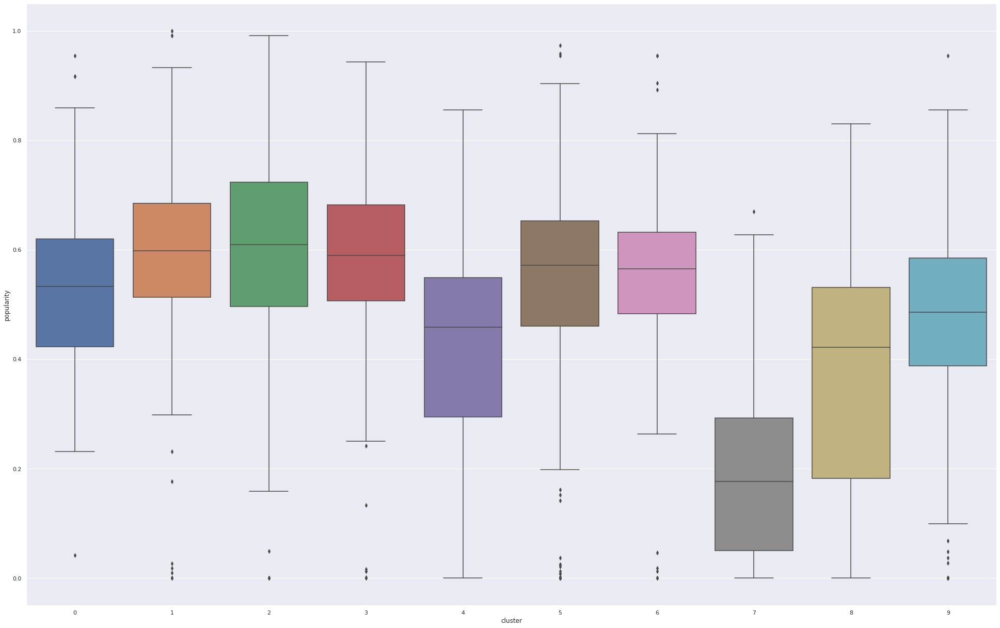

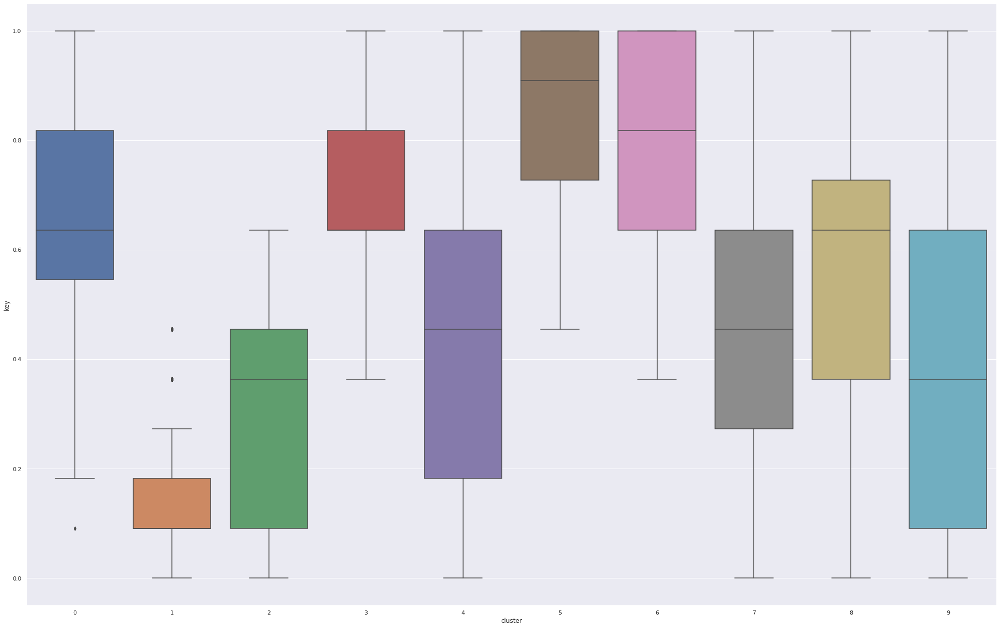

In [ ]:
#we use boxplot in order to visualize the model results and we can obtain information from these graphs such as the range of values in each cluster
for col in df.select_dtypes('number').columns:
    plt.figure()
    sns.boxplot(x='cluster', y=col, data=df_copy)

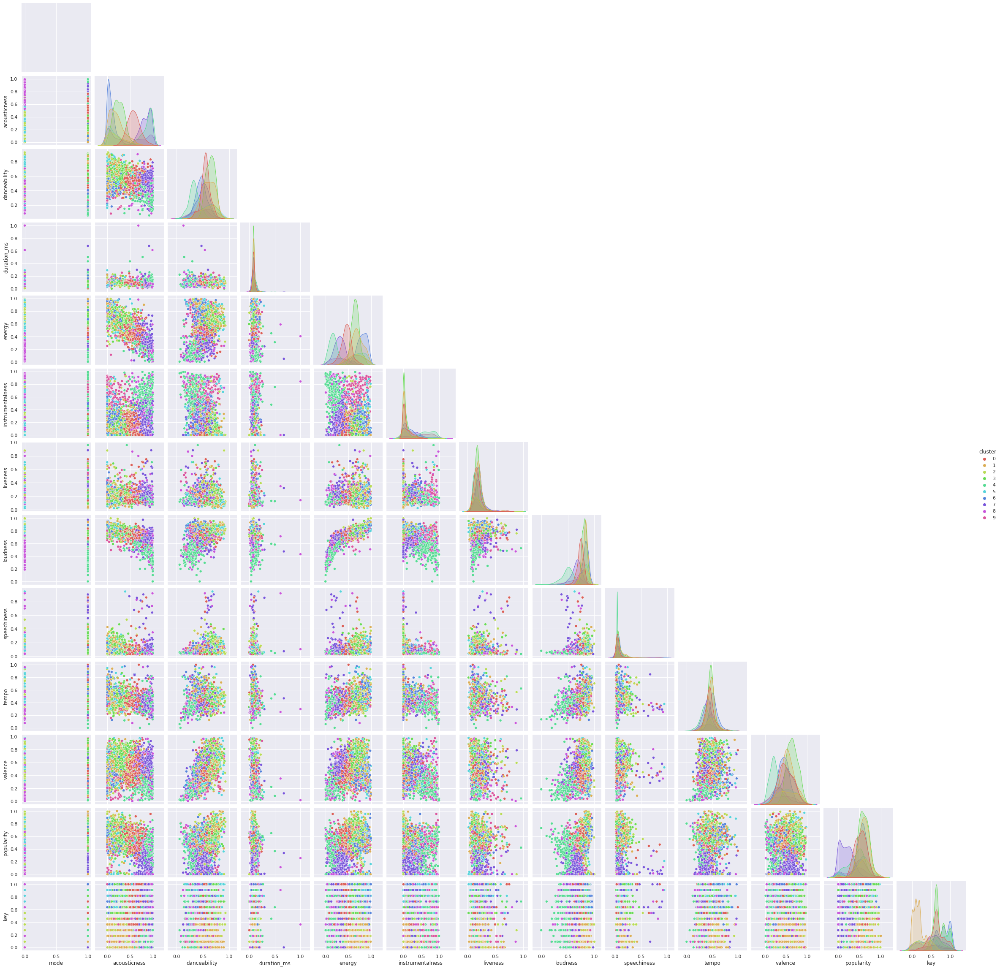

In [ ]:
sns.pairplot(df_copy, hue='cluster', palette=sns.color_palette('hls', 10), corner=True)

Random sample of 5 genres from each cluster

In [ ]:
df['cluster'] = labels


In [ ]:
cluster0=df[df['cluster']==0]
cluster0.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
612,1,classic peruvian pop,0.662411,0.625451,218703.861607,0.601018,0.001174,0.215055,-10.995179,0.074796,146.542795,0.796187,21.589286,6,0
1504,1,japanese indie folk,0.888000,0.772000,160173.000000,0.144000,0.000023,0.108000,-16.438000,0.051700,103.869000,0.468000,50.000000,5,0
2494,1,slc indie,0.344236,0.301422,267717.933333,0.424511,0.322346,0.100089,-12.217511,0.043860,137.112667,0.287844,54.355556,7,0
484,1,chamame,0.930750,0.613500,191613.500000,0.252500,0.001279,0.126450,-11.405000,0.065475,114.703500,0.366750,42.750000,6,0
654,1,classify,0.660304,0.524761,244216.188889,0.347588,0.484506,0.141954,-12.826087,0.080353,106.048124,0.420788,43.381618,9,0


In [ ]:
cluster1=df[df['cluster']==1]
cluster1.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
2443,1,scream rap,0.075924,0.745450,196303.500000,0.797600,0.028117,0.162430,-4.150250,0.278590,125.830250,0.515700,56.550000,1,1
1728,1,melbourne bounce,0.037993,0.710870,209019.648148,0.805500,0.063091,0.280441,-5.126759,0.077822,121.070333,0.552093,57.351852,5,1
1089,1,french hip hop,0.020708,0.779500,228939.000000,0.893000,0.263745,0.219950,-6.683000,0.104350,100.481000,0.667500,46.500000,1,1
573,1,cincinnati rap,0.214433,0.698333,241377.666667,0.729167,0.000000,0.215750,-5.100333,0.193017,138.131083,0.428083,58.833333,5,1
262,1,belgian hardcore,0.081847,0.509600,203581.200000,0.893400,0.000005,0.271800,-5.411000,0.073820,139.865400,0.698200,0.000000,0,1


In [ ]:
cluster2=df[df['cluster']==2]
cluster2.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
2743,0,trance mexicano,0.000217,0.9020,446470.000000,0.837000,0.261000,0.8800,-9.907000,0.06300,136.0070,0.594000,0.000000,3,2
2154,0,polish blues,0.405000,0.8080,191853.000000,0.356000,0.009760,0.1120,-9.921000,0.05450,120.8870,0.871000,48.000000,6,2
408,0,calgary indie,0.203000,0.4460,299853.000000,0.614000,0.011500,0.3610,-9.820000,0.03790,132.0500,0.779000,52.000000,6,2
1242,0,guinean pop,0.536000,0.4745,424133.000000,0.545000,0.434423,0.1300,-6.503500,0.03685,112.1535,0.630000,32.000000,0,2
1028,0,finnish alternative rock,0.150036,0.5280,261271.333333,0.658667,0.000036,0.2262,-4.555667,0.02510,96.0090,0.332667,60.333333,5,2


In [ ]:
cluster3=df[df['cluster']==3]
cluster3.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
1948,1,new romantic,0.154795,0.613453,257857.524837,0.686105,0.114574,0.182781,-10.195618,0.048923,122.710738,0.654315,41.976262,9,3
2167,1,polynesian pop,0.336364,0.724079,238325.140165,0.542658,0.019322,0.155173,-9.266921,0.097528,114.389477,0.751718,45.662102,11,3
254,1,bedroom soul,0.347382,0.659540,209885.882684,0.514902,0.022234,0.160048,-8.116731,0.060066,111.875087,0.535677,56.569372,9,3
389,1,brooklyn drill,0.273258,0.714693,197678.461222,0.672064,0.000054,0.157449,-5.978823,0.295912,117.428220,0.562317,65.260693,5,3
2264,1,puerto rican pop,0.423336,0.520339,241018.214649,0.609956,0.004835,0.220865,-7.842867,0.051912,114.940935,0.528421,53.958298,9,3


In [ ]:
cluster4=df[df['cluster']==4]
cluster4.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
2168,1,polyphony,0.974400,0.241870,153049.150000,0.158780,0.294430,0.21808,-25.764800,0.046415,110.388100,0.082915,43.550000,2,4
1490,1,japanese classical,0.718497,0.345608,340217.767736,0.338061,0.663564,0.16095,-15.219904,0.048029,101.784010,0.278272,42.065538,5,4
2636,1,swedish jazz,0.832052,0.451840,305954.331667,0.186996,0.542347,0.23077,-18.657500,0.042399,101.997690,0.312543,41.758810,5,4
1437,1,italian baroque,0.913350,0.326729,231494.360372,0.158531,0.534936,0.16667,-19.626027,0.042946,92.891350,0.238663,15.779628,7,4
639,1,classical guitar,0.980355,0.410676,220820.091295,0.062733,0.906445,0.10156,-28.711750,0.073843,107.958219,0.324290,29.030898,9,4


In [ ]:
cluster5=df[df['cluster']==5]
cluster5.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
585,0,classic colombian pop,0.609919,0.662785,191909.228462,0.440442,0.066267,0.169490,-10.050232,0.060412,116.185343,0.760588,22.186459,10,5
2643,0,swedish power metal,0.147553,0.413442,344141.325397,0.769347,0.110987,0.219414,-6.549196,0.072073,136.367312,0.319605,44.335979,7,5
2497,0,slovak electronic,0.092028,0.820200,385330.600000,0.677400,0.883600,0.150660,-11.005200,0.095000,124.209400,0.534000,0.000000,5,5
399,0,buffalo ny indie,0.234475,0.552007,224824.421176,0.633551,0.023835,0.114720,-10.494755,0.072426,115.548532,0.521227,45.256471,10,5
1930,0,new beat,0.018683,0.756333,281407.750000,0.828250,0.272695,0.196100,-7.841333,0.056975,124.880750,0.563833,47.500000,10,5


In [ ]:
cluster6=df[df['cluster']==6]
cluster6.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
1262,1,hard alternative,0.002344,0.422641,218898.844928,0.893254,0.011830,0.165773,-4.798364,0.084590,137.460926,0.426567,47.353623,7,6
1481,1,j-rock,0.077349,0.514465,265233.153431,0.865545,0.085869,0.199320,-4.214660,0.069732,128.633810,0.568148,59.999387,6,6
882,1,doom metal,0.048513,0.303050,312823.019097,0.774421,0.387010,0.243790,-8.459930,0.058506,123.276854,0.330575,38.523872,11,6
2483,1,ska punk,0.094059,0.515084,195852.463234,0.835933,0.045610,0.237983,-6.004959,0.096267,130.320257,0.638083,41.423229,9,6
2537,1,south african rock,0.198759,0.496866,241620.510753,0.759290,0.016212,0.097673,-4.705075,0.044373,132.140446,0.427181,56.768817,8,6


In [ ]:
cluster7=df[df['cluster']==7]
cluster7.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
551,1,christelijk,0.926000,0.430000,145031.000000,0.423000,0.000037,0.135000,-6.273000,0.028000,105.924000,0.281000,6.000000,0,7
2415,1,samba de roda,0.695798,0.546496,225795.012664,0.280768,0.014244,0.173622,-14.955109,0.090088,100.963507,0.505144,27.378200,4,7
1535,1,jazz cubano,0.721264,0.614078,227087.727460,0.599004,0.505726,0.151261,-9.459019,0.050719,117.231326,0.683854,18.393492,7,7
1567,1,jug band,0.902926,0.561128,192970.517361,0.350484,0.057980,0.209531,-11.533784,0.055728,115.030211,0.564260,13.725000,7,7
2671,1,syrian pop,0.827096,0.379346,370918.711538,0.274769,0.022049,0.331042,-11.401692,0.044113,98.009962,0.459135,10.346154,11,7


In [ ]:
cluster8=df[df['cluster']==8]
cluster8.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
1248,0,guzheng,0.980000,0.209000,405960.000000,0.177000,0.957000,0.086900,-16.630000,0.040000,141.980000,0.105000,41.000000,2,8
2830,0,university choir,0.964000,0.084700,205493.000000,0.085600,0.592000,0.289000,-24.716000,0.040500,84.245000,0.076400,54.000000,2,8
1891,0,native american,0.771953,0.387265,233890.475400,0.219946,0.476112,0.138738,-21.300133,0.062938,102.363289,0.469486,38.450282,6,8
2606,0,sufi chant,0.623357,0.504214,218092.642857,0.485214,0.115444,0.195907,-8.267429,0.040900,125.684786,0.452214,0.071429,11,8
1226,0,greek swing,0.961533,0.540733,200543.033333,0.369967,0.100632,0.233293,-13.315500,0.061770,120.062533,0.748033,1.733333,7,8


In [ ]:
cluster9=df[df['cluster']==9]
cluster9.sample(n=5,random_state=1)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
859,1,detroit house,0.108265,0.712150,318294.650000,0.718800,0.488450,0.151750,-11.965900,0.060560,119.020000,0.644690,51.500000,3,9
886,1,dream pop,0.319238,0.424434,282167.866186,0.565271,0.387606,0.166406,-10.733201,0.047372,124.893567,0.364084,44.828103,7,9
2804,1,uk experimental electronic,0.448859,0.639422,337283.518919,0.588083,0.724206,0.121181,-13.627065,0.089961,133.859384,0.423196,45.724324,1,9
1049,1,focus trance,0.010704,0.710667,399675.000000,0.813000,0.904667,0.285533,-9.201000,0.054667,125.672667,0.362167,0.000000,1,9
2526,1,sound effects,0.288896,0.175342,158493.966667,0.405983,0.788586,0.479033,-18.883967,0.116428,107.675317,0.092099,46.183333,5,9


In [ ]:
import numpy as np

# For each cluster 
# (1) Find all the points from X that are assigned to the cluster. 
# (2) Choose x% from those points randomly.

n_clusters = 10
x = 0.04# percentage

for i in range(n_clusters):

    # (1) indices of all the points from X that belong to cluster i
    C_i = np.where(km.labels_ == i)[0].tolist() 
    n_i = len(C_i) # number of points in cluster i

    # (2) indices of the points from X to be sampled from cluster i
    sample_i = np.random.choice(C_i, int(x * n_i)) 
    print(i, sample_i)

0 [2112 1857 2769  299  477  299  403 2255  340 2162 1984  766 1540 2413
 2875]
1 [1459  138 2017  242 2409 1357  434  913  255 2320   32 2263 1062 1051
 1513 1626  110 2922]
2 [1589  408 1919 2505  513  726   70]
3 [ 364  706 2203 1894  692 2328  735 1419  417 2447  273 1948  897 2506
 2621 2739  396  908  245 1285]
4 [2155 2278 2934 2159 2659 1544 2400 1097 2528  920 1174]
5 [ 910 2666 2093 2079  924 1446  243]
6 [1680 1188 1058 1331 2070 2802  820  887 1344 2018 2219 2219 2502 1510]
7 [2780  183 1461 2891 2277  551 1533 2072 2760 2285 1692  655   23]
8 [ 269 1871 2862  279]
9 [  93 1774  898 1517 1434  940]


Clusters Conclusion:

Cluster 0: includes the most normal distribution of acousticness. Acousticness data points are distributed equally. 

Cluster 1: has the second lowest average of instrumentalism, and has the second highest average loudness. 

Cluster 2: has the widest distribution of data points with reference to valence. It has the highest average popularity. It also includes the lowest average instrumentalism. 

Cluster 3: has the highest danceability average. It also includes a low average speechiness and instrumentalism. 

Cluster 4: has the highest average acousticness, lowest average danceability, energy, valence, tempo and loudness. 

Cluster 5: has the most normally distributed points in valence. 

Cluster 6: has the highest average energy and loudness and tempo. 

Cluster 7: has normally distributed energy.

Cluster 8: has the widest distribution of instrumentalism. 

Cluster 9: has the highest average duration and instrumentalism. 